# Исследование заведений общественного питания города Москвы

**Цель проекта**

На основании открытых данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места открытия заведения общественного пистания. 

Презентация необходима информативная и лаконичная для демонстрации группе инвесторов.

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: «Средний счёт: 1000–1500 ₽»;«Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽» и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений, если в строке указано одно число — цена без диапазона, то в столбец войдёт это число, если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений, если в строке указано одно число — цена без диапазона, то в столбец войдёт это число, если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**Содержание**

- [Шаг 1. Загрузка данных и изучение общей информации](#Шаг-1-Загрузка-данных-и-изучение-общей-информации)
- [Шаг 2. Выполнение предобработки данных](#Шаг-2-Выполнение-предобработки-данных)
- [Шаг 3. Анализ данных](#Шаг-3-Анализ-данных)
- [Шаг 4. Детализация исследования: открытие кофейни](#Шаг-4-Детализация-исследования-открытие-кофейни)
- [Шаг 5. Подготовка презентации](#Шаг-5-Подготовка-презентации)

## Шаг 1. Загрузка данных и изучение общей информации
<a id="Шаг-1-Загрузка-данных-и-изучение-общей-информации"></a>

### Изучение общей информации о датасете.  Определене количества заведений.  Изучение значений столбцов и их типов. 

In [1]:
# осуществим импорт необходимых библиотек
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
import datetime as dt
import json
import folium
from folium.plugins import MarkerCluster
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats
from fuzzywuzzy import fuzz, process
from folium import Marker, Map
from folium import Map, Choropleth

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

# выставляем ограничение на показ знаков после запятой
pd.options.display.float_format = '{:,.2f}'.format

# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":200, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

# для выведения названий гипотиз целиком.
pd.set_option('display.max_colwidth', False)

In [3]:
# чтение файлов с данными и сохранение в df

try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [4]:
# отобразим первые пять строк df 
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
# Выведем краткую информацию о df 
display(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

**Всего в df 8406 заведений**. 

**Всего 14 столбцов с данными:**
- name: название заведения (непустой столбец).
- category: категория заведения (непустой столбец).
- address: адрес заведения (непустой столбец).
- district: административный район (непустой столбец).
- hours: информация о днях и часах работы (присутствует в 7870 записях, 536 записей отсутствуют).
- lat: широта географической точки, в которой находится заведение (непустой столбец).
- lng: долгота географической точки, в которой находится заведение (непустой столбец).
- rating: рейтинг заведения по оценкам пользователей в Яндекс Картах (непустой столбец).
- price: атегория цен в заведении (присутствует в 3315 записях, отсутствует в 5091 записи).
- avg_bill: строка, которая хранит среднюю стоимость заказа в виде диапазона (присутствует в 3816 записях, отсутствует в 4590 записях).
- middle_avg_bill: число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт» (присутствует в 3149 записях, отсутствует в 5257 записях).
- middle_coffee_cup: исло с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино» (присутствует в 535 записях, отсутствует в 7871 записи).
- chain: число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (непустой столбец).
- seats: количество посадочных мест(присутствует в 4795 записях, отсутствует в 3611 записях).


**Пропущенные данные:**
- Столбцы с значительными пропусками: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
- Более половины записей не имеют информации о средней цене чашки кофе и средней сумме счета.

**Типы данных:**
- Столбцы с числовыми значениями: (float64): lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats, (int64):chain.
- Столбцы с текстовыми значениями (object): name, category, address, district, hours, price, avg_bill.

**Рейтинг и геолокация:**
- Все заведения имеют указанные координаты (широта и долгота) и рейтинг.

In [6]:
# выведем основные статистические характеристики df 
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


**Краткий вывод по статистическим данным**
- Географическое расположение: значения широты и долготы показывают, что заведения находятся в достаточно узком диапазоне координат, что может свидетельствовать о локализованности данных в пределах одного города или региона.

- Рейтинг:
- Средний рейтинг заведений составляет 4.23, что указывает на высокую оценку заведений пользователями.
- Значения рейтингов варьируются от 1.00 до 5.00, что показывает наличие как очень низко, так и очень высоко оцененных заведений.

- Средний чек и цена чашки кофе:
- Средний чек (958.05) и средняя цена чашки кофе (174.72) имеют значительное стандартное отклонение, что указывает на большую вариативность цен в заведениях.
- Присутствуют экстремальные значения среднего чека до 35,000.00, что может свидетельствовать о включении в выборку как очень дорогих, так и бюджетных заведений.

- Принадлежность к сети:
- В среднем 38% заведений принадлежат к сетям.

- Количество посадочных мест:
- Среднее количество посадочных мест составляет 108.42, с большим разбросом (до 1,288 мест), что указывает на разнообразие размеров заведений от маленьких кафе до крупных ресторанов.


## Шаг. Выполнение предобработки данных
<a id="Шаг-2-Выполнение-предобработки-данных"></a>

### Изучение на наличие дубликатов в данных. Поиск пропусков и их обработка. 

In [7]:
# проверим наличие дубликатов
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


В df нет полностью идентичных строк.

In [8]:
# проверим на наличие дубликатов в столбце 'lat'
print('Количество дубликатов в столбце lat:', data['lat'].duplicated().sum())

Количество дубликатов в столбце lat: 197


In [9]:
# проверим на наличие дубликатов в столбце 'lng'
print('Количество дубликатов в столбце lng:', data['lng'].duplicated().sum())

Количество дубликатов в столбце lng: 148


In [10]:
# проверим на наличие дубликатов в столбце 'category'
print('Количество дубликатов в столбце category:', data['category'].duplicated().sum())

Количество дубликатов в столбце category: 8398


In [11]:
# проверим на наличие дубликатов в столбце 'address'
print('Количество дубликатов в столбце address:', data['address'].duplicated().sum())

Количество дубликатов в столбце address: 2653


In [12]:
# проверим на наличие дубликатов в столбце 'district'
print('Количество дубликатов в столбце district:', data['district'].duplicated().sum())

Количество дубликатов в столбце district: 8397


In [13]:
# проверим на наличие дубликатов в столбце 'hours'
print('Количество дубликатов в столбце hours:', data['hours'].duplicated().sum())

Количество дубликатов в столбце hours: 7098


Повторяющиеся значения в столбцах 'hours', 'district', 'category', 'lng', 'lat' допустимы, так как в одних координатах, одном округе, с идентичными часами работы, по одному адресу могут располагаться несколько заведений. В представленном df есть сетевые и одиночные заведения, поэтому возможны и повторения названий. 

In [14]:
# проверим на наличие пропусков
print('Количество пропусков:', data.isna().sum())

Количество пропусков: name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64


**Вывод о наличии пропусков в df:**
    
- hours: 536 пропусков (6.4% от общего количества записей).
- price: 5091 пропусков (60.5% от общего количества записей).
- avg_bill: 4590 пропусков (54.6% от общего количества записей).
- middle_avg_bill: 5257 пропусков (62.5% от общего количества записей).
- middle_coffee_cup: 7871 пропусков (93.6% от общего количества записей).
- seats: 3611 пропусков (43.0% от общего количества записей).

Дубликатов строк нет, есть большое количество дубликатов в столбцах,  присутствуют пропуски в некоторых столбцах. Обработать большую часть их них не получится, так как в некоторых вообще не указаны цены и места, дублирование данных в некоторых столбцах допустимо. Данные пропуски оставляем без изменений.

### Создание столбца street с названиями улиц из столбца с адресом.

In [15]:
# добавим столбец с названием улицы
def street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
data['street'] = data.apply(street, axis=1)

In [16]:
# отобразим первые пять строк df 
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица


Столбец street с названиями улиц из столбца с адресом создан

### Создание столбца is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [17]:
# создадим столбец is_24/7
data['is_24_7'] = data[data['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
data['is_24_7'] = data['is_24_7'].fillna(False)

In [18]:
# отобразим первые пять строк df 
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,False


Столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно создан.

##  Анализ данных
<a id="Шаг-3-Анализ-данных"></a>

### Определение категории заведений представлены в данных. Исследование количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализации. Ответьт на вопрос о распределении заведений по категориям.

In [19]:
# определим категории заведений  и их количество в df
display(data.groupby('category')['name'].count().sort_values(ascending=False).reset_index())

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [20]:
# построим круговую диаграмму заведений по категориям и их количеству
count_cat = data.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
count_cat.columns= ['values']

name_cat = count_cat.index
values = count_cat['values']

fig = go.Figure(data=[go.Pie(labels=name_cat, values=values, pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Распределение количества заведений по категориям')          
fig.show() 

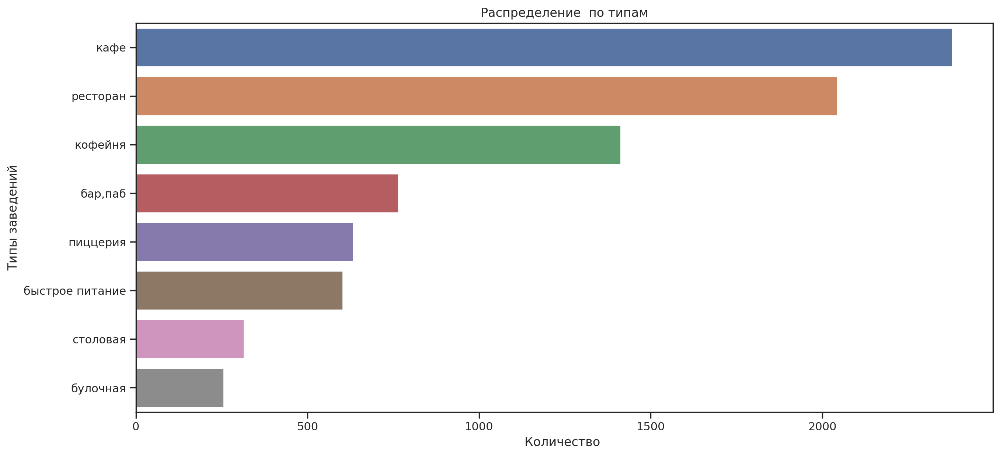

In [21]:
# построим столбчатую диаграмму заведений по категориям и их количеству
a =data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15, 7))
sns.barplot(x='name', y='category', data=a)
plt.title('Распределение  по типам')
plt.xlabel('Количество ')
plt.ylabel('Типы заведений')
plt.show()

- Кафе: 28.3%
- Ресторан: 24.3%
- Кофейня: 16.8%
- Бар, паб: 9.1%
- Пиццерия: 7.53%
- Быстрое питание: 7.17%
- Столовая: 3.75%
- Булочная: 3.05%

- Кафе и рестораны составляют наибольшую часть рынка (более 50%). Это говорит о высокой популярности и распространенности этих типов заведений.
- Булочные и столовые имеют наименьшие показатели, что может указывать на меньшую популярность или меньшую численность таких заведений в исследуемом регионе.

### Исследование количества посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализации. Анализ результов, выводы.

In [22]:
# определим статистические данные по количеству посадочных мест
data.seats.describe()

count   4,795.00
mean    108.42  
std     122.83  
min     0.00    
25%     40.00   
50%     75.00   
75%     140.00  
max     1,288.00
Name: seats, dtype: float64

В выборке 4795 значений.
- В среднем, заведения имеют 108.42 мест. Это значение дает представление о типичном размере заведения.
- В данном случае стандартное отклонение довольно велико (122.83), что указывает на значительную вариацию в количестве мест между заведениями.
- В выборке есть заведения, у которых нет мест. Как булочные так и кофейни могут работать только "на вынос".
- 25-й процентиль (или первый квартиль) указывает, что 25% заведений имеют 40 мест или меньше. 
- Медиана, или 50-й процентиль, указывает на то, что 50% заведений имеют 75 мест или меньше. 
- 75-й процентиль указывает, что 75% заведений имеют 140 мест или меньше. 
- Самое большое количество мест среди заведений составляет 1288.

In [23]:
# определим количество посадочных мест по категориям по среднему значению
data.groupby('category')['seats'].mean().sort_values(ascending=False).reset_index()

,category,seats
0,"бар,паб",124.53
1,ресторан,121.94
2,кофейня,111.20
3,столовая,99.75
4,быстрое питание,98.89
5,кафе,97.51
6,пиццерия,94.50
7,булочная,89.39


In [24]:
# определим количество посадочных мест по категориям по медиане
data.groupby('category')['seats'].median().sort_values(ascending=False).reset_index()

,category,seats
0,ресторан,86.00
1,"бар,паб",82.50
2,кофейня,80.00
3,столовая,75.50
4,быстрое питание,65.00
5,кафе,60.00
6,пиццерия,55.00
7,булочная,50.00


Данные расчетов по среднему показателю и по медиане разнятся. Медиана является более надежным показателем, поскольку она лучше справляется с выбросами и дает более четкое представление о типичном размере заведения. Но для учета всех данных и понимания общего тренда среднее значение также может быть полезным. Будем использовать оба показателя для получения более полного анализа.

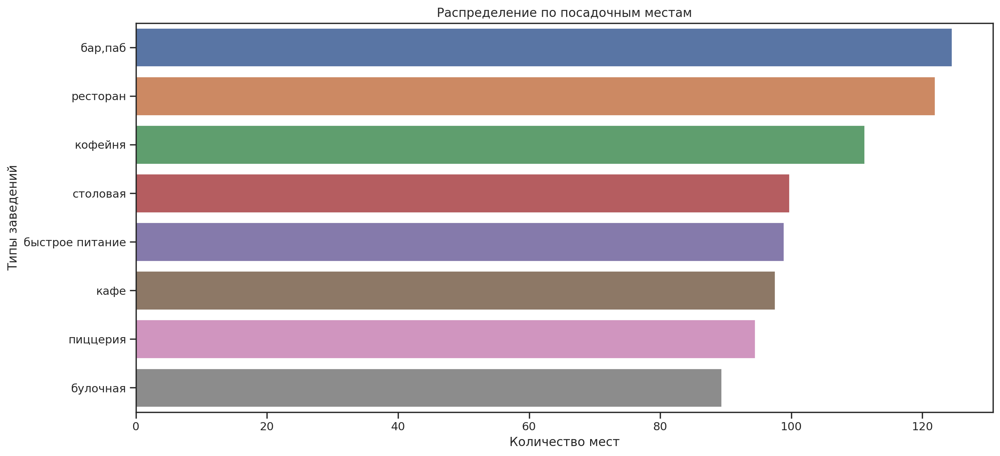

In [25]:
# построим столбчатую диаграмму по среднему значению
b =data.groupby('category')['seats'].mean().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15, 7))
sns.barplot(x='seats', y='category', data=b)
plt.title('Распределение по посадочным местам')
plt.xlabel('Количество мест')
plt.ylabel('Типы заведений')
plt.show()

Среднее значение посадочных мест:
- наибольшее количество в баре, пабе - 124.53,
- ресторан - 121.94
- кофейня - 111.20
- столовая	- 99.75
- быстрое питание -	98.89
- кафе	- 97.51
- пиццерия	- 94.50
- булочная	- 89.39

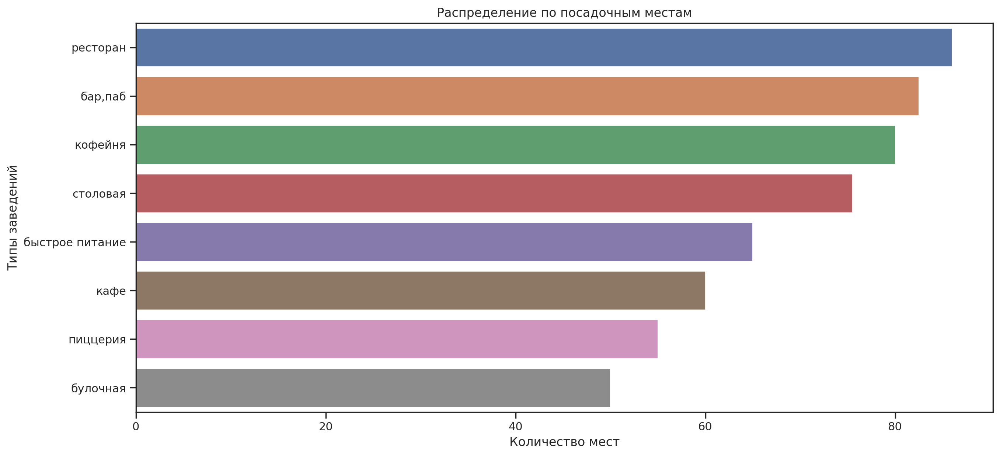

In [26]:
# построим столбчатую диаграмму по среднему значению
b =data.groupby('category')['seats'].median().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15, 7))
sns.barplot(x='seats', y='category', data=b)
plt.title('Распределение по посадочным местам')
plt.xlabel('Количество мест')
plt.ylabel('Типы заведений')
plt.show()

Типичное значение посадочных мест:
- ресторан	86.00
- бар,паб	82.50
- кофейня	80.00
- столовая	75.50
- быстрое питание	65.00
- кафе	60.00
- пиццерия	55.00
- булочная	50.00 

Количество мест почти везде одинаковое, меньше всего в булочной и пиццерии.

### Рассмотрение и изображение соотношения сетевых и несетевых заведений в датасете. Определение наибольших  заведений.

In [27]:
# определим количество заведений в разбивке 
chain_gr = data.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
chain_gr

,chain,name
0,0,5201
1,1,3205


In [28]:
name_rest = ['Не сетевые', 'Сетевые']
fig = go.Figure(data=[go.Pie(labels=name_rest, values=chain_gr.name)])
fig.update_layout(title='Распределение сетевых и несетевых заведений') 
fig.show()

- Несетевых заведений 61.9%
- Сетевых заведений 38.1%

### Определение категории заведений, которые чаще являются сетевыми. Исследование данных, построение  графика.

In [29]:
# определим категории сетевых заведений
chain_type = data.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_type['total'] = chain_type[0] + chain_type[1]
chain_type['rate'] = chain_type[1] / chain_type['total']
chain_type = chain_type.sort_values(by='rate', ascending=False)
chain_type

chain,category,0,1,total,rate
1,булочная,99,157,256,0.61
5,пиццерия,303,330,633,0.52
4,кофейня,693,720,1413,0.51
2,быстрое питание,371,232,603,0.38
6,ресторан,1313,730,2043,0.36
3,кафе,1599,779,2378,0.33
7,столовая,227,88,315,0.28
0,"бар,паб",596,169,765,0.22


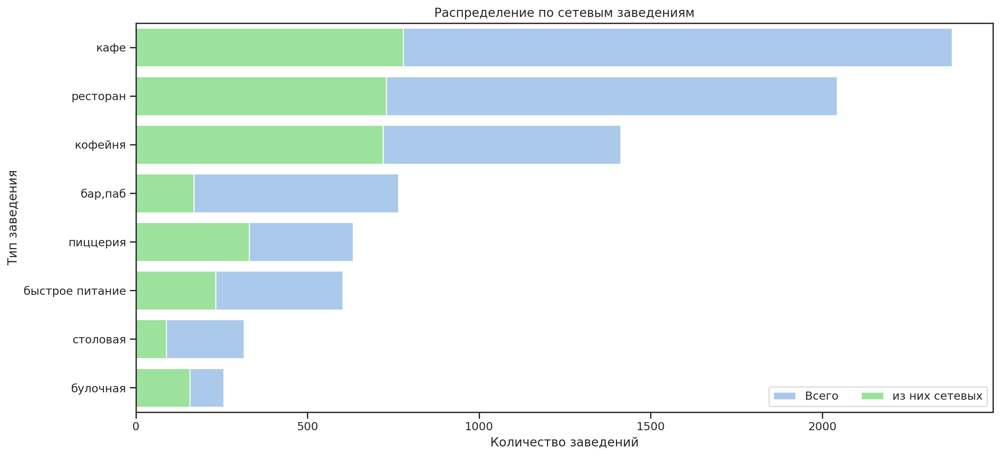

In [30]:
# построим график распределения заведений по сетям
f, ax = plt.subplots(figsize=(15, 7))
sns.set_color_codes('pastel')
chain_sorted = chain_type.sort_values('total', ascending=False)
sns.barplot(x='total', y='category', data=chain_sorted,
            label='Всего', color='b', edgecolor='w')
sns.set_color_codes('muted')
sns.barplot(x=1, y='category', data=chain_sorted,
            label='из них сетевых', color='lightgreen', edgecolor='w')
ax.legend(ncol=2, loc='lower right')
ax.set(ylabel="Тип заведения", xlabel="Количество заведений")
plt.title('Распределение по сетевым заведениям')
plt.show()

Наибольшее число сетевых заведений в категории кофейня и пиццерия.

### Группировка данных по названиям заведений, определение топ-15 популярных сетей в Москве. Построение визуализации. Узнаваемость сетей. Объединяющий сети признак. Определение  категории заведения. 

In [31]:
# отобразим на воронке Топ -15 популярных сетей в Москве
chain_network = data[data['chain'] == 1]
top_chain = pd.DataFrame(chain_network.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
top_chain.columns= ['values']

name_cat = top_chain.index
values = top_chain['values']

fig = go.Figure(data=[go.Funnel(x=values, y=name_cat)])
fig.update_layout(title='Топ-15 сетевых заведений')          
fig.show()

Сети Шоколадница, Домино'с Пицца, Додо Пицца  и остальные из ТОП -15 узнаваемы. 

In [32]:
# определим количество заведений по категориям
chain_network.groupby('category')['name'].count().sort_values()

category
столовая           88 
булочная           157
бар,паб            169
быстрое питание    232
пиццерия           330
кофейня            720
ресторан           730
кафе               779
Name: name, dtype: int64

Объедиянющий фактор сетевых заведений их тип: кафе, рестораны, кофейни.

### Определение административных районов Москвы  в датасете. Отображение общего количества заведений и количества заведений каждой категории по районам. Построение   графика.

In [33]:
# определим административные районы  в df
print('Административные районы: ', '; '.join(data['district'].unique()))

Административные районы:  Северный административный округ; Северо-Восточный административный округ; Северо-Западный административный округ; Западный административный округ; Центральный административный округ; Восточный административный округ; Юго-Восточный административный округ; Южный административный округ; Юго-Западный административный округ


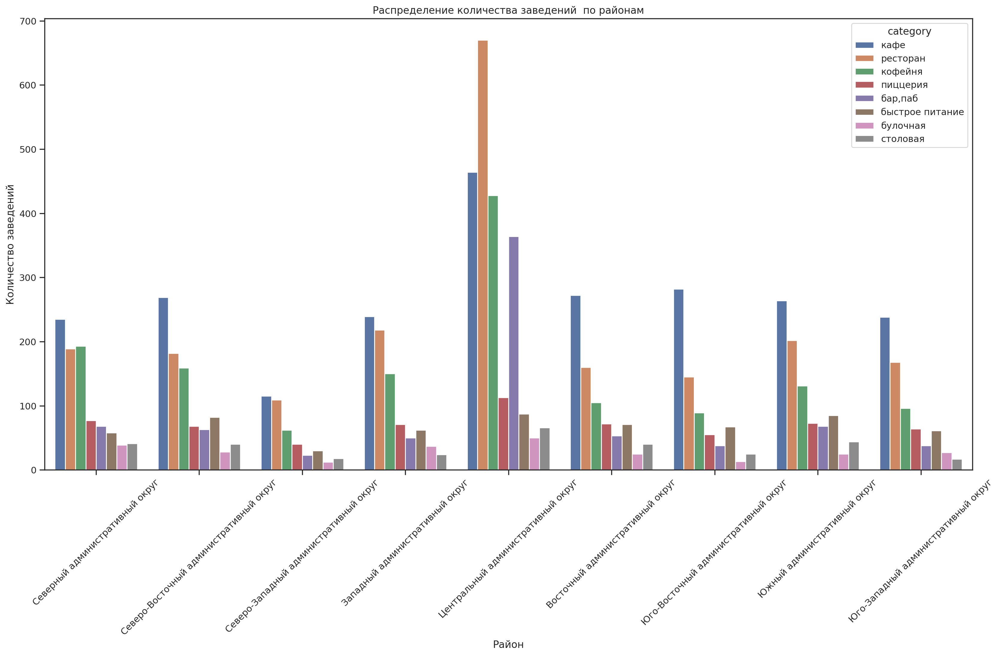

In [34]:
# построим столбчатую диаграмму с распределением заведений по районам
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=45)
plt.xlabel('Район')  
plt.ylabel('Количество заведений')  
plt.title('Распределение количества заведений  по районам')
plt.show()

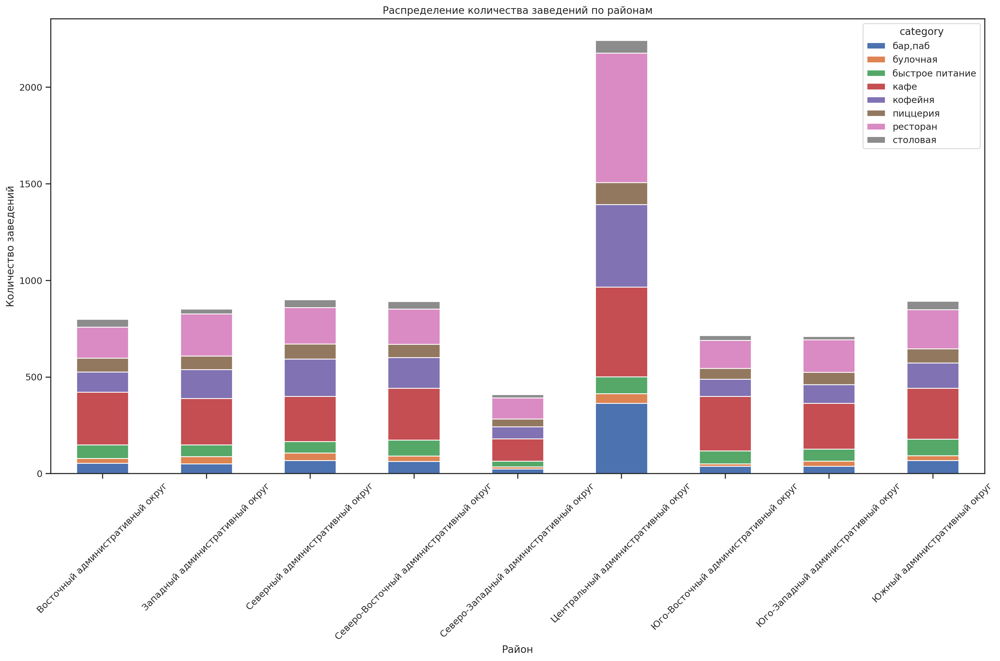

In [35]:
# построим графики с накоплением (столбчатую диаграмму) с распределением заведений по районам
district_category_counts = data.groupby(['district', 'category']).size().unstack(fill_value=0)
district_category_counts.plot(kind='bar', stacked=True, figsize=(20, 10))
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.title('Распределение количества заведений по районам')
plt.xticks(rotation=45)
plt.show()


- Данные содержат информацию по 9 районам Москвы.
- Наибольшее число ресторанов, кафе, кофеен, баров, пабов расположено в Центральном административном округе.
- В остальных районах распеределение кафе, кофеен примерно одинаковое, кроме Северо-западного административного округа, где кафе, ресторанов и кофеен меньше других округов.
- Количество пиццерий в округах примерно одинаковое, кроме Северо-западного административного округа.

### Визуализирование распределения средних рейтингов по категориям заведений. Определение различий усреднённых рейтингов в разных типах общепита.

In [36]:
# создадим df с медианными значениями рейтинга по районам
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.30
1,Западный административный округ,4.30
2,Северный административный округ,4.30
3,Северо-Восточный административный округ,4.20
4,Северо-Западный административный округ,4.30
5,Центральный административный округ,4.40
6,Юго-Восточный административный округ,4.20
7,Юго-Западный административный округ,4.30
8,Южный административный округ,4.30


In [37]:
# создадим df со средним значениями рейтинга по районам
rating_mean = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.30
1,Западный административный округ,4.30
2,Северный административный округ,4.30
3,Северо-Восточный административный округ,4.20
4,Северо-Западный административный округ,4.30
5,Центральный административный округ,4.40
6,Юго-Восточный административный округ,4.20
7,Юго-Западный административный округ,4.30
8,Южный административный округ,4.30


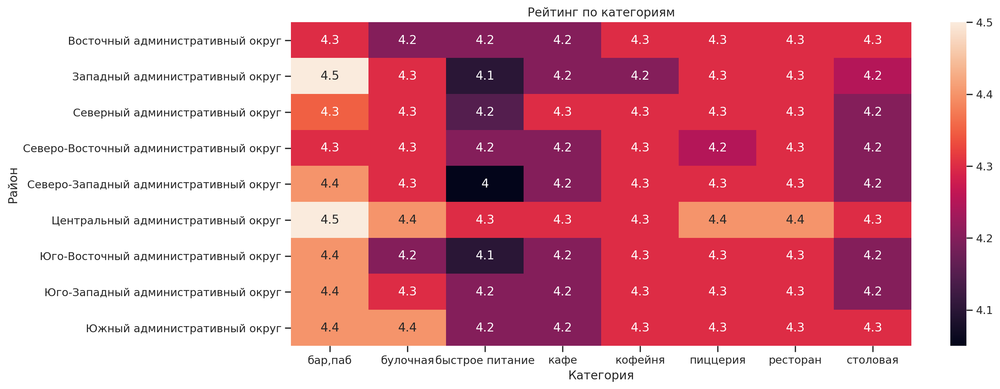

In [38]:
# построим построения тепловую карту с медианным значением рейтинга по районам и категориям
data_df = data.pivot_table(index='district', columns='category', values='rating', aggfunc='median')
plt.figure(figsize=(14,6))
plt.title('Рейтинг по категориям')
sns.heatmap(data_df, annot=True)
plt.xlabel('Категория')  
plt.ylabel('Район')      
plt.show()

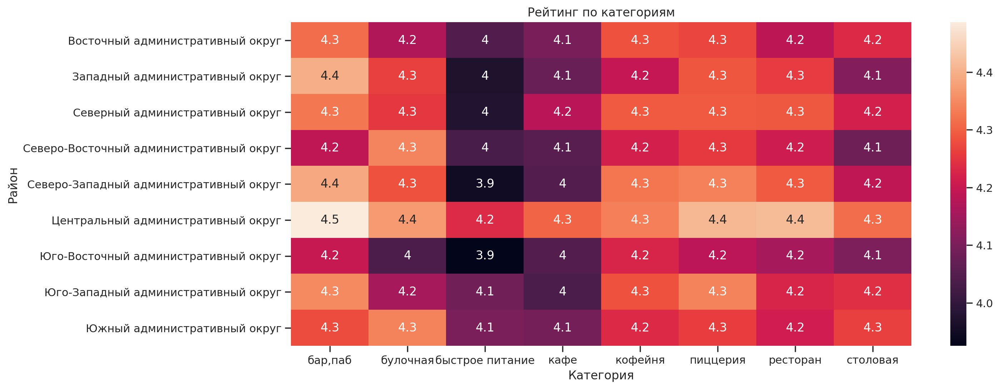

In [39]:
# построим построения тепловую карту со средним значением рейтинга по районам и категориям
data_mean = data.pivot_table(index='district', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(14,6))
plt.title('Рейтинг по категориям')
sns.heatmap(data_mean, annot=True)
plt.xlabel('Категория')  
plt.ylabel('Район') 
plt.show()

- Центральный административный округ стабильно показывает самые высокие рейтинги как по медиане (4.40), так и по среднему значению (4.38). Это указывает на то, что заведения в этом районе в среднем воспринимаются как более качественные или удобные по локации по сравнению с другими районами.

- Большинство районов имеют медианные рейтинги 4.30, что показывает высокий уровень консистентности в качестве заведений в разных районах. 

-  Несмотря на то, что медианные рейтинги довольно последовательны, средние значения показывают небольшие различия:
- Средние рейтинги для Северо-Восточного (4.15), Юго-Восточного (4.10) и Юго-Западного (4.17) административных округов немного ниже по сравнению с другими. Это может указывать на наличие более значительных отклонений (либо очень высокие, либо очень низкие рейтинги) в этих районах по сравнению с другими.
- Тот факт, что медианные рейтинги немного выше и более последовательны, чем средние значения, может указывать на наличие нескольких заведений с низкими рейтингами, которые снижают среднее значение. Это подчеркивает надежность медианы как показателя, предоставляющего более четкое представление о типичном качестве заведений в каждом районе.

### Построение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [40]:
# Чтение файла GeoJSON
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# Проверка первых нескольких записей в файле GeoJSON
print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [41]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Большинство заведений находится в Центральном административном округе города Москвы, данные заведения имеют с высокий рейтинг.

### Отображение всех заведений датасета на карте с помощью кластеров средствами библиотеки folium.

In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Основное количество заведений с высоким рейтингом расположены в Центральном административном округе Москвы.

### Определение топ-15 улиц по количеству заведений. Построение графика распределения количества заведений и их категорий по этим улицам. Иллюстрация данной информации одним графиком.

In [43]:
# создадим сводную таблицу для подсчета количества заведений на каждой улице
street = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top_street = street.index
street

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


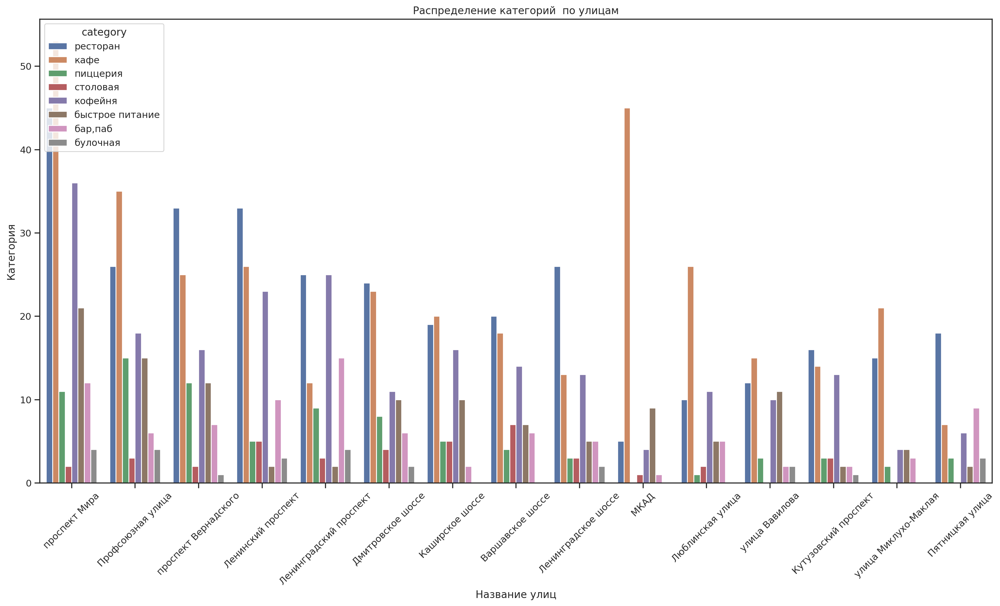

In [44]:
# построим график с убыванием по количеству заведений
street = data.query('street in @top_street')
street_counts = street['street'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=street, order=street_counts.index)
plt.title('Распределение категорий  по улицам')
plt.xticks(rotation=45)
plt.xlabel('Название улиц')
plt.ylabel('Категория')
plt.show()

Самое большое количество заведений на проспекте Мира, Профсоюзной улице, проспекте Вернадского, Ленинградском проспекте. По количеству кафе, кофеен и ресторанов лидирует проспект Мира, чуть ниже показатели Профсоюзной улице, проспекте Вернадского, Ленинградском проспекте. Большое количество кафе на МКАД.

### Определение улиц, на которых находится только один объект общепита. Анализ данных заведений.

In [45]:
# определим количество улиц с одним заведением
one_type = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_type =one_type[one_type['name'] == 1]
print(one_type.shape[0], 'улиц')

458 улиц


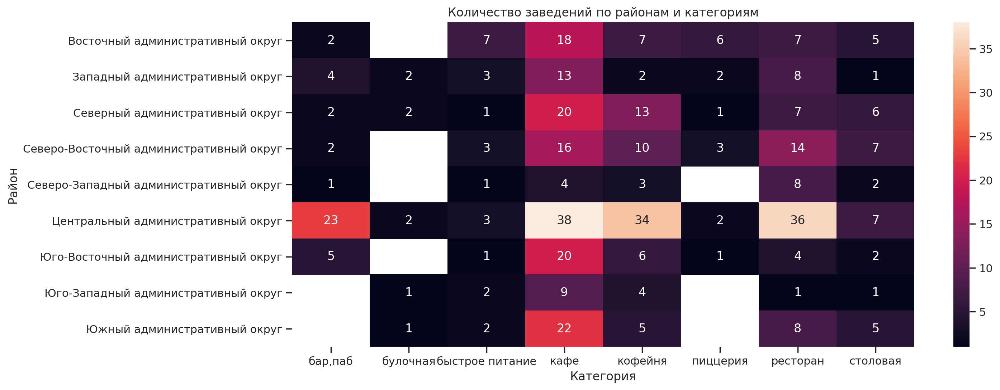

In [46]:
# построим тепловую карту улиц с одним заведением
one_type_st = one_type.index
one_type_data = data.query('street in @one_type_st')
data1 = one_type_data.pivot_table(index='district', columns='category', values='rating', aggfunc='count')
plt.figure(figsize=(14,6))
sns.heatmap(data1, annot=True)
plt.xlabel('Категория')
plt.ylabel('Район')
plt.title('Количество заведений по районам и категориям')
plt.show()

- Большая часть улиц с одним заведением находятся в центральном административном округе Москвы, из них 38 кафе, 34 кофейни, 36 ресторанов.
- Всего улиц с одним заведением 458, самые популярные - кафе.


**Причинами расположения одного заведения на улице могут быть:**

1. Жилые районы: некоторые улицы могут располагаться в жилых зонах с меньшей коммерческой активностью. В таких районах основное назначение — жилье, а не бизнес, что ограничивает количество.

2. Исторические и архитектурные ограничения: ЦАО включает исторические и значимые районы, на которые могут налагаться ограничения на строительство и реконструкцию зданий. Это может ограничить количество коммерческих помещений и соответствующих учреждений.

3. Высокие арендные ставки: ЦАО известно своими арендными поставками на коммерческую недвижимость. Малый и средний бизнес не может позволить себе аренду в таких регионах, что приводит к меньшему количеству предприятий.

4. Конкуренция: высокая конкуренция может сделать открытие нового рискованного предприятия. Если на одной улице уже есть популярное заведение, на другой может быть сложно привлечь достаточного клиента.

5. Проблемы с парковкой и транспортной доступностью: проблемы с парковкой и транспортной доступностью могут отпугнуть клиентов и сделать помещение менее привлекательным.

6. Небольшие размеры улиц: некоторые улицы в ЦАО могут быть небольшими по размеру и протяженности или иметь узкие тротуары, что ограничивает пространство для размещения нескольких заведений.


### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном.  Определение  медианы этого столбца для каждого района. Использование этого значения в качестве ценового индикатора района. Построение фоновой картограммы (хороплет) с полученными значениями для каждого района. Анализ цен в центральном административном округе и других. Влияние удалённости от центра на цены в заведениях

In [47]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill = median_bill.sort_values(by='middle_avg_bill', ascending=False)
median_bill

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [48]:
# создаем карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Медианный чек заведений по районам',
).add_to(m)

m

- Самый высокий средний чек в Центральном административном  и Западном административном округах (1000 рублей), самый низкий чек в Юго-восточном администратичном округе.
- По карте видно, что удаленность от центра не влияет на средний чек только в Западном административном округе, в остальных округах средний чек ниже среднего чека Центрального административного округа.

### Общий вывод

1. Кафе и рестораны составляют наибольшую часть рынка (более 50%). Это говорит о высокой популярности и распространенности этих типов заведений. Булочные и столовые имеют наименьшие показатели, что может указывать на меньшую популярность или меньшую численность таких заведений в исследуемом регионе.
- Кафе: 28.3%
- Ресторан: 24.3%
- Кофейня: 16.8%
- Бар, паб: 9.1%
- Пиццерия: 7.53%
- Быстрое питание: 7.17%
- Столовая: 3.75%
- Булочная: 3.05%


2. Медианное значение посадочных мест примерно одинаковое для заведений.
- ресторан 86.00
- бар,паб 82.50
- кофейня 80.00
- столовая 75.50
- быстрое питание 65.00
- кафе 60.00
- пиццерия 55.00
- булочная 50.00

3. Данные содержат информацию о сетевых и несетевых завдениях, из которых:
- несетевых заведений 61.9%
- сетевых заведений 38.1%.

4. Наибольшее число сетевых заведений в категории кофейня и пиццерия.

5. Сети Шоколадница, Домино'с Пицца, Додо Пицца и остальные из ТОП -15 узнаваемы. Объедиянющий фактор сетевых заведений их тип: кафе, рестораны, кофейни.

6. Данные содержат информацию по 9 районам Москвы.
- Наибольшее число ресторанов, кафе, кофеен, баров, пабов расположено в Центральном административном округе.
- В остальных районах распеределение кафе, кофеен примерно одинаковое, кроме северо-западного административного округа, где кафе, ресторанов и кофеен меньше других округов

7. Центральный административный округ стабильно показывает самые высокие рейтинги как по медиане (4.40), так и по среднему значению (4.38). Это указывает на то, что заведения в этом районе в среднем воспринимаются как более качественные или удобные по локации по сравнению с другими районами. Большинство районов имеют медианные рейтинги 4.30, что показывает высокий уровень консистентности в качестве заведений в разных районах.

8. Самое большое количество заведений на проспекте Мира, Профсоюзной улице, проспекте Вернадского, Ленинградском проспекте. По количеству кафе, кофеен и ресторанов лидирует проспект Мира, чуть ниже показатели Профсоюзной улице, проспекте Вернадского, Ленинградском проспекте. Большое количество кафе на МКАД.

9. Больше всего улицы с одним заведением в центральном административном округе Москвы, из них 38 кафе, 34 кофейни, 36 ресторанов. Всего улиц с одним заведением 458, самое большое количество - кафе.

10. Самый высокий средний чек в Центральном административном и Западном административном округах (1000 рублей), самый низкий чек в Юго-восточном администратичном округе.

11. Удаленность от центра не влияет на средний чек только в Западном административном округе, в остальных округах средний чек ниже среднего чека Центрального административного округа.

## Шаг. Детализация исследования: открытие кофейни
<a id="Шаг-4-Детализация-исследования-открытие-кофейни"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Определение количества кофеен в датасете. В каких районах их больше всего, каковы особенности их расположения.

In [49]:
# определим количество кофеен
cafe = data[data['category'] == 'кофейня']
print('Количество кофеeн:', len(cafe))

Количество кофеeн: 1413


In [50]:
# создаем карту расположения кофеен по районам
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)

# выводим карту
m

- Всего в df 1413 кофеен, из которых 631 расположены в Центральном административном округе Москвы.
- Концентрация наблюдается в близи метро, крупных офисных центров (например, БЦ Арма (6 кофеен), Москва-Сити (6 кофеен)).

### Наличие  круглосуточных кофеен.

In [51]:
# определим количество круглосуточных кофеен
coffee_24_7 = cafe[cafe['is_24_7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24_7))

Количество круглосуточных кофеен: 59


In [52]:
# создаём карту Москвы с круглосуточными кофейнями
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
m

В центральном административном округе расположены 34 из 59 круглосуточных кафе.

### Определение рейтинга кофеен. Распределене рейтингов по районам.

In [53]:
# определим рейтинг кофеен по районам
coffee_rating = cafe.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [54]:
# создаём карту размещения кофеен по районам с учетом рейтинга
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Кофейни с наибольшим рейтингом расположены в Центральном и Северо-западном административных округах.

### На какую стоимость чашки капучино стоит ориентироваться при открытии. Причины.

In [55]:
# определим стомость чашки капучино по районам
cup = cafe.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup)
coffee_price = round(cup['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


In [56]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m)

# выводим карту
m

Наиболее высокая стоимость средней чашки кофе в Центральном, Западном и Юго-западном административных округах. Это связано с высоким средним чеком всех заведений в Центральном и Западном административных округах. Поэтому при открытии бизенса рекомендуется ориентироваться на более низкую стоимость чашки кофе.

**Вывод**
- Всего в df 1413 кофеен, из которых 631 расположены в Центральном административном округе Москвы.
- Концентрация наблюдается в близи метро, крупных офисных центров
- В центральном административном округе расположены 34 из 59 круглосуточных кафе.
- Кофейни с наибольшим рейтингом расположены в Центральном и Северо-западном административных округах.
- Средняя стоимость чашки кофе в Москве: 171.32

### Построение визуализации. Рекомендации для открытия нового заведения. 

**Расположение:**

- Центральный административный округ (ЦАО):
- ЦАО уже имеет высокую концентрацию кофеен (631 из 1413), что может означать высокую конкуренцию.
- Однако, высокий трафик, наличие туристов, офисных работников и постоянных жителей делает ЦАО привлекательным местом для новых кофеен.
- Рекомендуется выбирать места вблизи метро и крупных офисных центров, чтобы воспользоваться высоким потоком потенциальных клиентов.

- Северо-западный административный округ:
- Этот округ также показывает высокий рейтинг кофеен, что может указывать на высокие стандарты и требовательную клиентуру.
- Открытие кофейни здесь может быть успешным, особенно если предложить уникальный продукт или атмосферу.

**Рабочие часы:**

- Учитывая, что в ЦАО расположены 34 из 59 круглосуточных кафе, стоит рассмотреть возможность работы в формате 24/7, особенно в районах с высоким ночным трафиком (близость к клубам, баром, туристическим зонам).
Это поможет привлечь клиентов в любое время суток и увеличить прибыль.

**Ценовая политика:**

- Средняя стоимость чашки кофе в Москве составляет 171.32 рублей. 
- Рассмотрите возможность предложения различных ценовых категорий: от бюджетных вариантов до премиальных.
- Важно предложить конкурентоспособные цены, особенно на начальном этапе, чтобы привлечь больше клиентов.

**Качество и сервис:**

- Кофейни с наибольшим рейтингом расположены в Центральном и Северо-западном округах, что указывает на высокие ожидания клиентов в этих районах.
- Обеспечение высокого качества кофе, разнообразного меню и отличного обслуживания будет ключевым фактором для привлечения и удержания клиентов.
- Регулярное обучение персонала и контроль качества продукции помогут достичь этого.

**Маркетинг и продвижение:**

- Разработайте стратегию маркетинга, включающую онлайн и офлайн каналы.
- Используйте социальные сети для продвижения вашего бренда, проведения акций и взаимодействия с клиентами.
- Рассмотрите возможность проведения мероприятий и акций, чтобы привлечь новых клиентов и повысить узнаваемость кофейни.
- В целях снижения затрат на продвижение и маркетинг рекомендуется расмотреть вариант открытия кофейни по франшизе. По данным сайта Лучшие франшизы России <https://topfranchise.ru/catalog/franshiza-kofejni/?PAGEN_1=2> cтоимость инвестицй по  франшизе:
- у наиболее популярной сети Шоколадница составляет от 13,5 млн.рублей, 
- у чуть менее популярной сети One Price Coffee jn 1,2 млн.рублей,
- у Cofix -  от 5 млн.руб.

**Уникальные предложения:**

- Рассмотрите возможность предложения уникальных продуктов, которые могут выделить вашу кофейню среди конкурентов (например, фирменные напитки, десерты или специальные предложения).
- Внедрение программ лояльности и бонусов для постоянных клиентов также может способствовать повышению посещаемости.

**Заключение**

- Открытие кофейни в Москве требует тщательного планирования и анализа. Учитывая высокую конкуренцию, особенно в Центральном административном округе, важно найти уникальные преимущества и предложения для привлечения клиентов. Обеспечение высокого качества продукции и обслуживания, разумная ценовая политика и эффективная маркетинговая стратегия будут ключевыми факторами успеха вашей кофейни.


## Шаг. Подготовка презентации
<a id="Шаг-5-Подготовка-презентации"></a>

### Подготовка презентации исследования для инвесторов.

Презентация: <https://drive.google.com/file/d/1SkZ0fOm4nzz7wk0Fn9s1KtgbnlCNa_hn/view?usp=drive_link>